#                          Analysis Of Meteorological Data

In [1]:
import numpy as np 
import pandas as pd 
%matplotlib inline
import matplotlib.pyplot as plt


In [2]:
#loading the dataset
df = pd.read_csv('WeatherHistory.csv')
df.shape 

(96453, 12)

In [3]:
df.dtypes

Formatted Date               object
Summary                      object
Precip Type                  object
Temperature (C)             float64
Apparent Temperature (C)    float64
Humidity                    float64
Wind Speed (km/h)           float64
Wind Bearing (degrees)      float64
Visibility (km)             float64
Loud Cover                  float64
Pressure (millibars)        float64
Daily Summary                object
dtype: object

In [4]:
df['Formatted Date'] = pd.to_datetime(df['Formatted Date'], utc=True)
df['Formatted Date']

0       2006-03-31 22:00:00+00:00
1       2006-03-31 23:00:00+00:00
2       2006-04-01 00:00:00+00:00
3       2006-04-01 01:00:00+00:00
4       2006-04-01 02:00:00+00:00
                   ...           
96448   2016-09-09 17:00:00+00:00
96449   2016-09-09 18:00:00+00:00
96450   2016-09-09 19:00:00+00:00
96451   2016-09-09 20:00:00+00:00
96452   2016-09-09 21:00:00+00:00
Name: Formatted Date, Length: 96453, dtype: datetime64[ns, UTC]

In [5]:
df.dtypes

Formatted Date              datetime64[ns, UTC]
Summary                                  object
Precip Type                              object
Temperature (C)                         float64
Apparent Temperature (C)                float64
Humidity                                float64
Wind Speed (km/h)                       float64
Wind Bearing (degrees)                  float64
Visibility (km)                         float64
Loud Cover                              float64
Pressure (millibars)                    float64
Daily Summary                            object
dtype: object

In [6]:
df = df.set_index('Formatted Date')
df.head()

,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
Formatted Date,,,,,,,,,,,
2006-03-31 22:00:00+00:00,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
2006-03-31 23:00:00+00:00,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2006-04-01 00:00:00+00:00,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
2006-04-01 01:00:00+00:00,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
2006-04-01 02:00:00+00:00,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


In [7]:
#after resampling
data_columns = ['Apparent Temperature (C)', 'Humidity']
df_monthly_mean = df[data_columns].resample('MS').mean()
df_monthly_mean.head()

,Apparent Temperature (C),Humidity
Formatted Date,,
2005-12-01 00:00:00+00:00,-4.050000,0.890000
2006-01-01 00:00:00+00:00,-4.173708,0.834610
2006-02-01 00:00:00+00:00,-2.990716,0.843467
2006-03-01 00:00:00+00:00,1.969780,0.778737
2006-04-01 00:00:00+00:00,12.098827,0.728625


<AxesSubplot:title={'center':'Variation in Apparent Temperature and Humidity with time'}, xlabel='Formatted Date'>

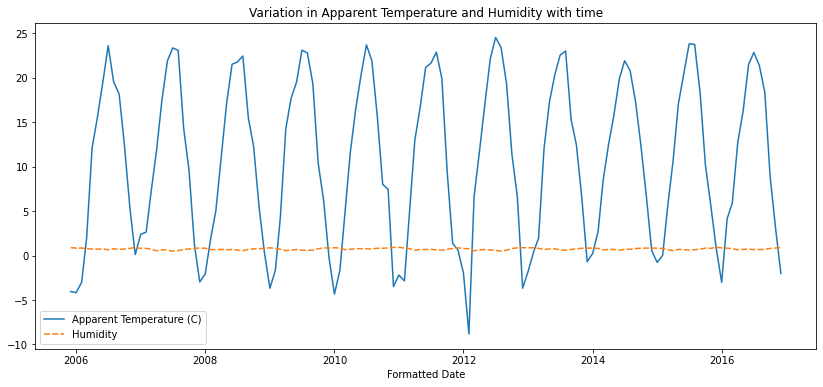

In [8]:
#Plotting the variation in Apparent Temperature and Humidity with time
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
plt.figure(figsize=(14,6))
plt.title("Variation in Apparent Temperature and Humidity with time")
sns.lineplot(data=df_monthly_mean)
#From the plot, we can say that humidity remained almost constant in these 10 years. Even the average apparent temperature is almost same (as peaks lie on the same line)

In [9]:
#retrieving the data of a particular month from every year, say April
df1 = df_monthly_mean[df_monthly_mean.index.month==9]
print(df1)
df1.dtypes

                           Apparent Temperature (C)  Humidity
Formatted Date                                               
2006-09-01 00:00:00+00:00                 18.155571  0.689444
2007-09-01 00:00:00+00:00                 14.328457  0.682708
2008-09-01 00:00:00+00:00                 15.489606  0.690722
2009-09-01 00:00:00+00:00                 19.322353  0.596764
2010-09-01 00:00:00+00:00                 15.549414  0.826806
2011-09-01 00:00:00+00:00                 19.899900  0.611375
2012-09-01 00:00:00+00:00                 19.302948  0.603319
2013-09-01 00:00:00+00:00                 15.317477  0.691986
2014-09-01 00:00:00+00:00                 17.258387  0.785944
2015-09-01 00:00:00+00:00                 18.308472  0.712889
2016-09-01 00:00:00+00:00                 18.355833  0.688833


Apparent Temperature (C)    float64
Humidity                    float64
dtype: object

Text(0.5, 0, 'Month of September')

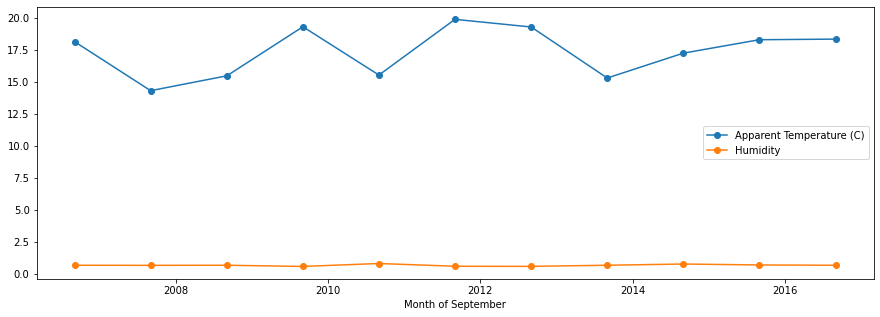

In [10]:
import matplotlib.dates as mdates
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(df1.loc['2006-9-01':'2016-9-01', 'Apparent Temperature (C)'], marker='o', linestyle='-',label='Apparent Temperature (C)')
ax.plot(df1.loc['2006-9-01':'2016-9-01', 'Humidity'], marker='o', linestyle='-',label='Humidity')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.legend(loc ='right')
ax.set_xlabel('Month of September')


# Observation :
## No change in average humidity over the ten years from 2005 to 2016. Decrease in average apparent temperature can be seen in the year 2008 then again it raised in 2010 , then a slight decrease in 2011 then a significant drop is observed in 2013 and again it slightly increased in 2016.

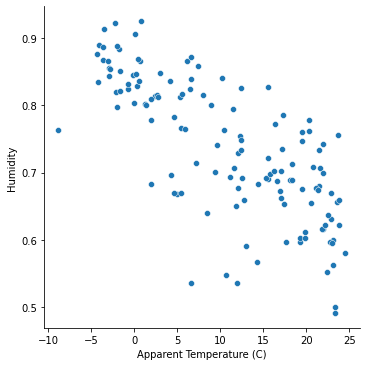

In [11]:
sns.relplot(x='Apparent Temperature (C)',y='Humidity',data=df_monthly_mean)
plt.show()

<AxesSubplot:>

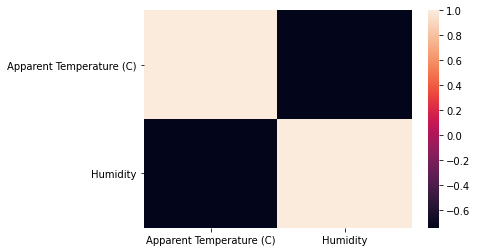

In [12]:
corr = df_monthly_mean.corr()
sns.heatmap(corr)

<AxesSubplot:xlabel='Humidity', ylabel='Density'>

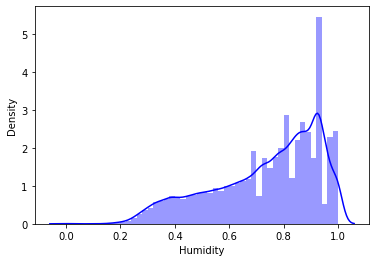

In [13]:
sns.distplot(df.Humidity,color='blue')

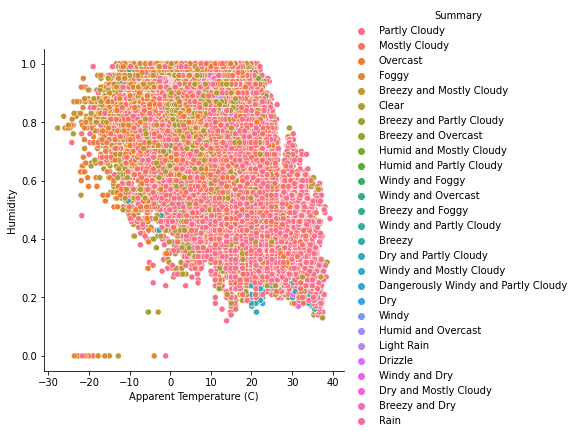

In [14]:
sns.relplot(data=df,x="Apparent Temperature (C)",y="Humidity",color="red",hue="Summary")